In [101]:
import pandas as pd 
import seaborn as sns 
import numpy as np 
import matplotlib.pyplot as plt

from tqdm import tqdm
import warnings
tqdm.pandas()
# import nltk 
# nltk.download('punkt')
from tqdm.notebook import tqdm_notebook as tqdm

sns.set()
pd.options.display.max_columns = None 


In [102]:
from pandas_profiling import ProfileReport


In [103]:
df1 = pd.read_csv("data_1.csv",index_col="codering")
df2 = pd.read_csv("data_2.csv",index_col="codering")
df3 = pd.read_csv("data_3.csv",index_col="codering")

In [104]:
df = pd.concat([df1,df2,df3],axis=1,copy=False)

num_cols = df.dtypes[df.dtypes == "float64"].keys().to_list()

cat_cols = df.dtypes[df.dtypes == "object"].keys().to_list()


#drop duplicte columns
df = df.T.drop_duplicates().T

df[num_cols] = df[num_cols].astype("float64")

In [105]:
df  = df.drop("id_old",axis=1)

In [106]:

df_buurt = df[df.soort_regio== "Buurt"]

df_wijk = df[df.soort_regio== "Wijk"]

df_gemeente = df[df.soort_regio== "Gemeente"]

In [7]:
profile = ProfileReport(df_buurt[num_cols+["gemeentenaam"]],minimal=True)

In [8]:
profile

Summarize dataset:   0%|          | 0/82 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Cleaning

In [205]:
dff_buurt = df_buurt.copy()

In [206]:
dff_buurt.shape

(13290, 77)

In [207]:
dff_buurt.dtypes

Unnamed: 0                                   object
gemeentenaam                                 object
soort_regio                                  object
id                                           object
aantal_inwoners                             float64
                                             ...   
arbeidsongeschiktheidsuitkering_relatief    float64
aow_uitkering_relatief                      float64
inwoners_vanaf_15_jaar                      float64
inwoners_vanaf_15_jr_tot_aow_leeftijd       float64
inwoners_vanaf_de_aow_leeftijd              float64
Length: 77, dtype: object

In [208]:
dff_buurt.columns[dff_buurt.isna().sum() == 0]

Index(['Unnamed: 0', 'gemeentenaam', 'soort_regio', 'id', 'aantal_inwoners',
       'woningkenmerken', 'stadsverwarming', 'mannen', 'vrouwen',
       'k_0_tot_15_jaar', 'k_15_tot_25_jaar', 'k_25_tot_45_jaar',
       'k_45_tot_65_jaar', 'k_65_jaar_of_ouder', 'huishoudens_totaal',
       'eenpersoonshuishoudens', 'huishoudens_zonder_kinderen',
       'huishoudens_met_kinderen', 'woningvoorraad',
       'aantal_inkomensontvangers', 'personenautos_brandstof_benzine',
       'personenautos_overige_brandstof', 'oppervlakte_land',
       'indelingswijziging_wijken_en_buurten',
       'werkloosheidsuitkering_relatief', 'bijstandsuitkering_relatief',
       'arbeidsongeschiktheidsuitkering_relatief', 'aow_uitkering_relatief',
       'inwoners_vanaf_15_jaar', 'inwoners_vanaf_15_jr_tot_aow_leeftijd',
       'inwoners_vanaf_de_aow_leeftijd'],
      dtype='object')

In [209]:

#columns with no NaNs and probably only zeros
dff_buurt_cols_w_zeros = list(dff_buurt.columns[dff_buurt.isna().sum() == 0].drop(["stadsverwarming"]))
print(dff_buurt_cols_w_zeros)
dff_buurt.loc[:,dff_buurt_cols_w_zeros] = dff_buurt.loc[:,dff_buurt_cols_w_zeros].replace(0,np.nan)


['Unnamed: 0', 'gemeentenaam', 'soort_regio', 'id', 'aantal_inwoners', 'woningkenmerken', 'mannen', 'vrouwen', 'k_0_tot_15_jaar', 'k_15_tot_25_jaar', 'k_25_tot_45_jaar', 'k_45_tot_65_jaar', 'k_65_jaar_of_ouder', 'huishoudens_totaal', 'eenpersoonshuishoudens', 'huishoudens_zonder_kinderen', 'huishoudens_met_kinderen', 'woningvoorraad', 'aantal_inkomensontvangers', 'personenautos_brandstof_benzine', 'personenautos_overige_brandstof', 'oppervlakte_land', 'indelingswijziging_wijken_en_buurten', 'werkloosheidsuitkering_relatief', 'bijstandsuitkering_relatief', 'arbeidsongeschiktheidsuitkering_relatief', 'aow_uitkering_relatief', 'inwoners_vanaf_15_jaar', 'inwoners_vanaf_15_jr_tot_aow_leeftijd', 'inwoners_vanaf_de_aow_leeftijd']


In [210]:
dff_buurt["percentage_woningen_met_stadsverwarming"] 

codering
BU08093091   NaN
BU05050202   NaN
BU05890208   NaN
BU09173201   NaN
BU01480103   NaN
              ..
BU17011002   NaN
BU00480104   NaN
BU17080509   NaN
BU19480210   NaN
BU16811209   NaN
Name: percentage_woningen_met_stadsverwarming, Length: 13290, dtype: float64

In [211]:
#Rescale huishoudgrootte  

dff_buurt.loc[:,"gemiddelde_huishoudensgrootte"] =dff_buurt.loc[:,"gemiddelde_huishoudensgrootte"]/10
dff_buurt["gemiddelde_huishoudensgrootte"] 

codering
BU08093091    2.6
BU05050202    2.3
BU05890208    3.0
BU09173201    1.3
BU01480103    2.1
             ... 
BU17011002    2.3
BU00480104    2.1
BU17080509    3.6
BU19480210    2.3
BU16811209    2.3
Name: gemiddelde_huishoudensgrootte, Length: 13290, dtype: float64

<AxesSubplot:xlabel='aantal_inwoners', ylabel='Count'>

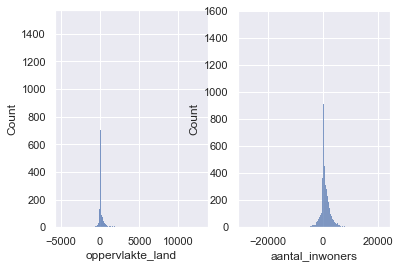

In [212]:

plt.subplot(1,2,1)

sns.histplot(dff_buurt['oppervlakte_land'])

plt.subplot(1,2,2)

sns.histplot(dff_buurt['aantal_inwoners'])




In [213]:
dff_buurt.loc[:,"aantal_inwoners_art"] = dff_buurt.vrouwen + dff_buurt.mannen
dff_buurt.loc[:,"aantal_inwoners"] = dff_buurt.loc[:,"aantal_inwoners"].apply(np.abs)

In [214]:
np.corrcoef(dff_buurt[["aantal_inwoners_art","aantal_inwoners"]].dropna()["aantal_inwoners_art"],dff_buurt[["aantal_inwoners_art","aantal_inwoners"]].dropna()["aantal_inwoners"])

array([[1.        , 0.99999758],
       [0.99999758, 1.        ]])

In [215]:
dff_buurt.loc[:,"oppervlakte_land"] = dff_buurt.loc[:,"oppervlakte_land"].apply(np.abs)

<AxesSubplot:xlabel='aantal_inwoners', ylabel='Count'>

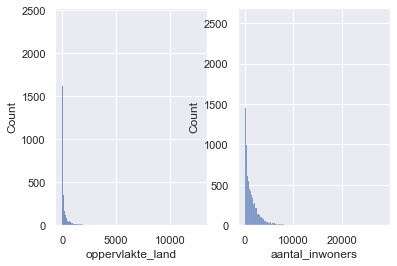

In [216]:
plt.subplot(1,2,1)
sns.histplot(dff_buurt['oppervlakte_land'])

plt.subplot(1,2,2)
sns.histplot(dff_buurt['aantal_inwoners'])

<AxesSubplot:xlabel='percentage_woningen_met_stadsverwarming', ylabel='Count'>

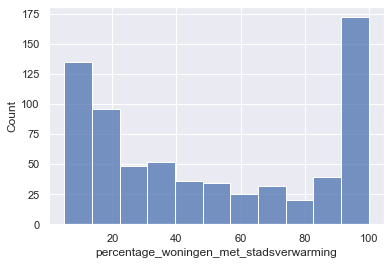

In [218]:
sns.histplot(dff_buurt["percentage_woningen_met_stadsverwarming"])

In [217]:
dff_buurt["percentage_woningen_met_stadsverwarming"] = dff_buurt["percentage_woningen_met_stadsverwarming"]/10 #*100
dff_buurt["percentage_woningen_met_stadsverwarming"].head(100) 

codering
BU08093091    NaN
BU05050202    NaN
BU05890208    NaN
BU09173201    NaN
BU01480103    NaN
             ... 
BU01830500    NaN
BU04000402    NaN
BU03631502    7.1
BU04530700    NaN
BU08740002    NaN
Name: percentage_woningen_met_stadsverwarming, Length: 100, dtype: float64

### Normalize data 

In [189]:
dff_buurt.loc[:,"k_40_huishoudens_met_laagste_inkomen"] = dff_buurt.loc[:,"k_40_huishoudens_met_laagste_inkomen"]/dff_buurt.loc[:,"huishoudens_totaal"]*100
dff_buurt.loc[:,"k_20_huishoudens_met_hoogste_inkomen"] = dff_buurt.loc[:,"k_20_huishoudens_met_hoogste_inkomen"]/dff_buurt.loc[:,"huishoudens_totaal"]*100

dff_buurt.loc[:,"gemiddeld_inkomen_per_inwoner"] = dff_buurt.loc[:,"gemiddeld_inkomen_per_inwoner"]*100

In [190]:
Huishouden_feats = ["eenpersoonshuishoudens", "huishoudens_zonder_kinderen",
"huishoudens_met_kinderen","gemiddelde_huishoudensgrootte"]

In [191]:
dff_buurt.loc[:,"eenpersoonshuishoudens"] = dff_buurt.loc[:,"eenpersoonshuishoudens"]/dff_buurt.loc[:,"huishoudens_totaal"] * 100
dff_buurt.loc[:,"huishoudens_zonder_kinderen"] = dff_buurt.loc[:,"huishoudens_zonder_kinderen"]/dff_buurt.loc[:,"huishoudens_totaal"] * 100
dff_buurt.loc[:,"huishoudens_met_kinderen"] = dff_buurt.loc[:,"huishoudens_met_kinderen"]/dff_buurt.loc[:,"huishoudens_totaal"] * 100


In [143]:
dff_buurt["totaal_aantal_laadpalen"] = dff_buurt["totaal_aantal_laadpalen"]/dff_buurt["aantal_inwoners"] * 100
dff_buurt["aantal_inkomensontvangers"] = dff_buurt["aantal_inkomensontvangers"]/dff_buurt["aantal_inwoners"] * 100

dff_buurt["werkloosheidsuitkering_relatief"] = dff_buurt["werkloosheidsuitkering_relatief"]/dff_buurt["aantal_inkomensontvangers"] *100
dff_buurt["personen_per_soort_uitkering_bijstand"] = dff_buurt["personen_per_soort_uitkering_bijstand"]/dff_buurt["aantal_inkomensontvangers"] *100
dff_buurt["bijstandsuitkering_relatief"] = dff_buurt["bijstandsuitkering_relatief"]/dff_buurt["aantal_inkomensontvangers"]*100
dff_buurt["arbeidsongeschiktheidsuitkering_relatief"] = dff_buurt["arbeidsongeschiktheidsuitkering_relatief"]/dff_buurt["aantal_inkomensontvangers"]*100
dff_buurt["aow_uitkering_relatief"] = dff_buurt["aow_uitkering_relatief"]/dff_buurt["aantal_inkomensontvangers"]*100

9000.0 18190.0


<AxesSubplot:xlabel='personenautos_overige_brandstof', ylabel='Count'>

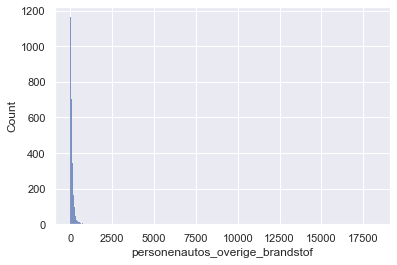

In [219]:
print(dff_buurt['personenautos_brandstof_benzine'].max(),dff_buurt['personenautos_overige_brandstof'].max())

sns.histplot(dff_buurt['personenautos_overige_brandstof'])

In [220]:
dff_buurt['personenautos_brandstof_benzine'] = dff_buurt['personenautos_brandstof_benzine'].apply(np.abs)

In [221]:
dff_buurt['personenautos_overige_brandstof']  = dff_buurt.apply(lambda x: x['personenautos_overige_brandstof'] if x['personenautos_overige_brandstof'] < x['aantal_inwoners'] else np.nan, axis=1)

In [222]:
# dff_buurt['personenautos_brandstof_benzine'] = dff_buurt['personenautos_brandstof_benzine'].combine(dff_buurt['aantal_inwoners'], lambda x1,x2: x1 if x1 < x2 else np.nan)


<AxesSubplot:xlabel='personenautos_overige_brandstof', ylabel='Count'>

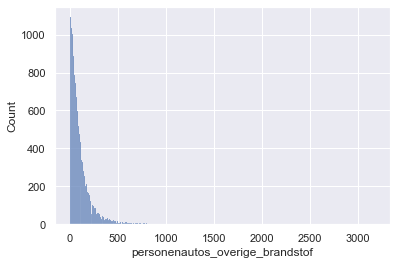

In [223]:
sns.histplot(dff_buurt['personenautos_overige_brandstof'])

In [224]:
dff_buurt['personenautos_brandstof_benzine'].max(),dff_buurt['personenautos_overige_brandstof'].max()

(9000.0, 3175.0)

In [225]:
dff_buurt['personenautos_brandstof_benzine'] = dff_buurt['personenautos_brandstof_benzine']/dff_buurt["aantal_inwoners"]*100
dff_buurt['personenautos_overige_brandstof'] = dff_buurt['personenautos_overige_brandstof']/dff_buurt["aantal_inwoners"]*100


#### Remove duplicates

In [200]:
print(dff_buurt[dff_buurt.duplicated()].shape)

dff_buurt = dff_buurt.drop_duplicates()


duplicates = dff_buurt.index.value_counts().loc[lambda x: x>1].index
dff_buurt.index.value_counts().loc[lambda x: x>1]

(0, 78)


BU00340306    2
BU02960124    2
BU03840219    2
BU16510009    2
BU07960601    2
BU02287051    2
BU18960109    2
BU19480425    2
BU04020401    2
BU19302501    2
BU08555701    2
BU03639602    2
BU03440831    2
BU03071301    2
BU03510001    2
BU08730101    2
BU09510003    2
BU08553807    2
BU07070100    2
BU05120600    2
BU01060703    2
BU17420209    2
BU17090000    2
BU19001008    2
BU03920702    2
BU03073000    2
BU01190200    2
BU19040702    2
BU02680970    2
BU19403101    2
BU19420508    2
BU03420604    2
BU17400106    2
BU00340401    2
Name: codering, dtype: int64

In [201]:
dff_buurt_ = dff_buurt[dff_buurt.index.isin(duplicates)].reset_index()
dff_buurt_.head(2)
# num_cols = dff_buurt.dtypes[dff_buurt.dtypes == "float64"].keys().to_list()

# cat_cols = dff_buurt.dtypes[dff_buurt.dtypes == "object"].keys().to_list()

,codering,Unnamed: 0,gemeentenaam,soort_regio,id,aantal_inwoners,woningkenmerken,stadsverwarming,mannen,vrouwen,k_0_tot_15_jaar,k_15_tot_25_jaar,k_25_tot_45_jaar,k_45_tot_65_jaar,k_65_jaar_of_ouder,huishoudens_totaal,eenpersoonshuishoudens,huishoudens_zonder_kinderen,huishoudens_met_kinderen,gemiddelde_huishoudensgrootte,bevolkingsdichtheid,woningvoorraad,gemiddelde_woningwaarde,koopwoningen,huurwoningen_totaal,in_bezit_woningcorporatie,in_bezit_overige_verhuurders,eigendom_onbekend,bouwjaar_voor_2000,bouwjaar_vanaf_2000,gemiddeld_elektriciteitsverbruik_totaal,elect_appartement,elect_tussenwoning,elect_hoekwoning,elect_twee_onder_een_kap_woning,elect_vrijstaande_woning,elect_huurwoning,elect_eigen_woning,gemiddeld_aardgasverbruik_totaal,aard_appartement,aard_tussenwoning,aard_hoekwoning,aard_twee_onder_een_kap_woning,aard_vrijstaande_woning,aard_huurwoning,aard_eigen_woning,percentage_woningen_met_stadsverwarming,aantal_inkomensontvangers,gemiddeld_inkomen_per_inkomensontvanger,gemiddeld_inkomen_per_inwoner,k_40_huishoudens_met_laagste_inkomen,k_20_huishoudens_met_hoogste_inkomen,personen_per_soort_uitkering_bijstand,personenautos_brandstof_benzine,personenautos_overige_brandstof,oppervlakte_land,mate_van_stedelijkheid,omgevingsadressendichtheid,bedrijfsvestigingen_totaal,type_a_landbouw_bosbouw_visserij,type_bf_nijverheid_energie,type_gi_handel_horeca,type_hj_vervoer_informatie_communicatie,type_kl_financiele_diensten_onroerendgoed,type_mn_zakelijke_dienstverlening,type_ru_cultuur_recreatie_overige_diensten,indelingswijziging_wijken_en_buurten,aantal_installaties_bij_woningen,aantal_zonnepanelen_per_installatie,opgesteld_vermogen_van_zonnepanelen,totaal_aantal_laadpalen,werkloosheidsuitkering_relatief,bijstandsuitkering_relatief,arbeidsongeschiktheidsuitkering_relatief,aow_uitkering_relatief,inwoners_vanaf_15_jaar,inwoners_vanaf_15_jr_tot_aow_leeftijd,inwoners_vanaf_de_aow_leeftijd,aantal_inwoners_art
0,BU19480425,9909,Meierijstad,Buurt,9,820.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,445.0,380.0,145.0,100.0,220.0,245.0,120.0,320.0,18.75,29.687500,50.000000,2.6,5450.0,310.0,186.0,94.0,6.0,0.0,6.0,0.0,100.0,0.0,3400.0,NaN,3470.0,3180.0,NaN,NaN,3100.0,3410.0,1510.0,NaN,1460.0,1610.0,NaN,NaN,1530.0,1510.0,NaN,600.0,NaN,NaN,49.375000,75.312500,0.0,40.243902,9.756098,15.0,2.0,1536.0,35.0,0.0,10.0,5.0,5.0,5.0,5.0,10.0,3.0,11.0,14.0,33.0,0.0,125.0,15.0,260.0,665.0,2740.0,2280.0,450.0,825.0
1,BU08555701,13895,Tilburg,Buurt,82,1848.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,1000.0,910.0,935.0,585.0,190.0,600.0,435.0,30.0,600.0,15.00,16.666667,68.333333,3.1,7807.0,605.0,268.0,80.0,20.0,16.0,3.0,0.0,0.0,100.0,3730.0,2280.0,3570.0,4360.0,NaN,5160.0,2440.0,4000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,1200.0,NaN,NaN,25.833333,64.666667,20.0,34.902597,8.658009,24.0,3.0,1007.0,105.0,0.0,15.0,20.0,10.0,10.0,35.0,10.0,3.0,25.0,NaN,NaN,0.0,105.0,60.0,145.0,85.0,5030.0,4910.0,110.0,1845.0


In [34]:
dff_buurt_1 =  dff_buurt.reset_index().drop_duplicates(subset="codering",keep="first").set_index("codering")
dff_buurt_2 = dff_buurt.reset_index().drop_duplicates(subset="codering",keep="last").set_index("codering")

In [36]:
df_combined = dff_buurt_1.combine(dff_buurt_2,np.maximum)
dff_buurt =df_combined

# dff_buurt = pd.concat([df_combined, dff_buurt[~(dff_buurt.isin(df_combined.index))]])

In [38]:
num_cols = dff_buurt.dtypes[dff_buurt.dtypes == "float64"].keys().to_list()

cat_cols = dff_buurt.dtypes[dff_buurt.dtypes == "object"].keys().to_list()

In [39]:
(dff_buurt.isna().sum() /len(dff_buurt)*100).sort_values()

Unnamed: 0                                  0.000000
gemeentenaam                                0.000000
soort_regio                                 0.000000
id                                          0.000000
woningkenmerken                             0.000000
                                             ...    
elect_appartement                          49.046033
aard_appartement                           50.446699
gemiddeld_inkomen_per_inwoner              84.865233
gemiddeld_inkomen_per_inkomensontvanger    89.203513
percentage_woningen_met_stadsverwarming    94.844034
Length: 78, dtype: float64

### Imputed missing values 


In [40]:
dff_buurt.head()

,Unnamed: 0,gemeentenaam,soort_regio,id,aantal_inwoners,woningkenmerken,stadsverwarming,mannen,vrouwen,k_0_tot_15_jaar,k_15_tot_25_jaar,k_25_tot_45_jaar,k_45_tot_65_jaar,k_65_jaar_of_ouder,huishoudens_totaal,eenpersoonshuishoudens,huishoudens_zonder_kinderen,huishoudens_met_kinderen,gemiddelde_huishoudensgrootte,bevolkingsdichtheid,woningvoorraad,gemiddelde_woningwaarde,koopwoningen,huurwoningen_totaal,in_bezit_woningcorporatie,in_bezit_overige_verhuurders,eigendom_onbekend,bouwjaar_voor_2000,bouwjaar_vanaf_2000,gemiddeld_elektriciteitsverbruik_totaal,elect_appartement,elect_tussenwoning,elect_hoekwoning,elect_twee_onder_een_kap_woning,elect_vrijstaande_woning,elect_huurwoning,elect_eigen_woning,gemiddeld_aardgasverbruik_totaal,aard_appartement,aard_tussenwoning,aard_hoekwoning,aard_twee_onder_een_kap_woning,aard_vrijstaande_woning,aard_huurwoning,aard_eigen_woning,percentage_woningen_met_stadsverwarming,aantal_inkomensontvangers,gemiddeld_inkomen_per_inkomensontvanger,gemiddeld_inkomen_per_inwoner,k_40_huishoudens_met_laagste_inkomen,k_20_huishoudens_met_hoogste_inkomen,personen_per_soort_uitkering_bijstand,personenautos_brandstof_benzine,personenautos_overige_brandstof,oppervlakte_land,mate_van_stedelijkheid,omgevingsadressendichtheid,bedrijfsvestigingen_totaal,type_a_landbouw_bosbouw_visserij,type_bf_nijverheid_energie,type_gi_handel_horeca,type_hj_vervoer_informatie_communicatie,type_kl_financiele_diensten_onroerendgoed,type_mn_zakelijke_dienstverlening,type_ru_cultuur_recreatie_overige_diensten,indelingswijziging_wijken_en_buurten,aantal_installaties_bij_woningen,aantal_zonnepanelen_per_installatie,opgesteld_vermogen_van_zonnepanelen,totaal_aantal_laadpalen,werkloosheidsuitkering_relatief,bijstandsuitkering_relatief,arbeidsongeschiktheidsuitkering_relatief,aow_uitkering_relatief,inwoners_vanaf_15_jaar,inwoners_vanaf_15_jr_tot_aow_leeftijd,inwoners_vanaf_de_aow_leeftijd,aantal_inwoners_art
codering,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
BU00030000,1551,Appingedam,Buurt,52,2338.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,1090.0,1245.0,230.0,210.0,485.0,695.0,710.0,1310.0,54.198473,27.862595,17.938931,1.7,2774.0,1479.0,120.0,39.0,59.0,41.0,19.0,2.0,83.0,17.0,2200.0,1720.0,2270.0,2620.0,2670.0,3170.0,1870.0,2770.0,1350.0,960.0,1320.0,1660.0,1680.0,2240.0,1090.0,1800.0,NaN,81.266039,NaN,NaN,45.267176,7.557252,110.747368,38.280582,6.629598,84.0,3.0,1190.0,175.0,5.0,10.0,80.0,10.0,10.0,30.0,30.0,1.0,137.0,13.0,427.0,0.042772,129.205263,203.036842,418.378947,1575.073684,8510.0,5780.0,2730.0,2335.0
BU00030001,1552,Appingedam,Buurt,95,3081.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,1535.0,1545.0,510.0,330.0,625.0,1015.0,595.0,1335.0,26.591760,37.453184,35.955056,2.3,1950.0,1330.0,163.0,69.0,31.0,29.0,2.0,1.0,92.0,8.0,2720.0,2050.0,2490.0,2740.0,2650.0,3120.0,2390.0,2870.0,1480.0,920.0,1280.0,1420.0,1520.0,1750.0,1220.0,1600.0,NaN,77.896787,NaN,24100.0,24.044944,14.307116,89.862500,41.382668,7.789679,158.0,4.0,894.0,105.0,5.0,20.0,15.0,5.0,20.0,25.0,15.0,1.0,429.0,14.0,1331.0,0.129828,134.793750,147.631250,263.168750,1148.956250,10200.0,7910.0,2280.0,3080.0
BU00030002,1553,Appingedam,Buurt,14,5957.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,2865.0,3090.0,935.0,630.0,1300.0,1625.0,1465.0,2735.0,35.100548,31.261426,33.638026,2.1,2094.0,2860.0,120.0,40.0,59.0,56.0,3.0,1.0,84.0,16.0,2410.0,1790.0,2660.0,2630.0,2470.0,2930.0,2180.0,2750.0,1400.0,970.0,1400.0,1550.0,1500.0,2040.0,1270.0,1550.0,NaN,77.220077,238.0,19000.0,19.670932,2.669104,453.250000,36.595602,5.707571,284.0,3.0,1112.0,195.0,5.0,25.0,70.0,15.0,20.0,20.0,40.0,1.0,354.0,15.0,1157.0,0.117509,148.925000,349.650000,388.500000,1456.875000,19770.0,14190.0,5580.0,5955.0
BU00030007,1554,Appingedam,Buurt,82,319.0,T001100ZW25810ZW25805ZW25806ZW10300ZW103201014...,0.0,165.0,150.0,65.0,35.0,70.0,110.0,30.0,115.0,17.391304,30.434783,47.826087,2.7,59.0,123.0,244.0,95.0,5.0,0.0,5.0,0.0,46.0,54.0,3190.0,NaN,NaN,Na

In [41]:
dff_buurt = dff_buurt.groupby("gemeentenaam").progress_apply(lambda x: x.fillna(x.mean())).drop(["gemeentenaam"],axis=1).reset_index()

100%|██████████| 388/388 [00:04<00:00, 79.83it/s]


In [42]:
# from sklearn.preprocessing import StandardScaler, MinMaxScaler
# from sklearn.impute import KNNImputer

# scaler = MinMaxScaler()
# dff_buurt_scaled = pd.DataFrame(scaler.fit_transform(dff_buurt[num_cols]), columns = num_cols)
# # dff_buurt_scaled.head()


# # imputer = KNNImputer(n_neighbors=5)
# # dff_buurt_scaled_imputed_KNN = pd.DataFrame(imputer.fit_transform(dff_buurt_scaled[num_cols]), columns = num_cols)
profile = ProfileReport(dff_buurt[num_cols+["gemeentenaam"]],minimal=True)

profile

/Users/arnogarstman/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4441: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


Summarize dataset:   0%|          | 0/82 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Duurzaam opgewekte elektra-pakketten - € 880,00 jaarcontract voor 2-persoons huishouden (berekend op 2500 kwh)

In [43]:
# Huishouden_feats = ["eenpersoonshuishoudens", "huishoudens_zonder_kinderen",
# "huishoudens_met_kinderen","gemiddelde_huishoudensgrootte"]


Huishouden_feats = ["eenpersoonshuishoudens", "huishoudens_met_kinderen","gemiddelde_huishoudensgrootte"]

# Elec_vebruikfeats = ['elect_appartement', 'elect_tussenwoning', 'elect_hoekwoning',
#        'elect_twee_onder_een_kap_woning', 'elect_vrijstaande_woning',
#        'elect_huurwoning', "elect_eigen_woning","gemiddeld_elektriciteitsverbruik_totaal"]


Elec_vebruikfeats = ['elect_appartement', 'elect_tussenwoning',
       'elect_huurwoning', "gemiddeld_elektriciteitsverbruik_totaal"]

Economische_status =["aantal_inkomensontvangers","gemiddeld_inkomen_per_inkomensontvanger","gemiddeld_inkomen_per_inwoner",
                     "k_40_huishoudens_met_laagste_inkomen","k_20_huishoudens_met_hoogste_inkomen",
                     "personen_per_soort_uitkering_bijstand","werkloosheidsuitkering_relatief",
                     "bijstandsuitkering_relatief","arbeidsongeschiktheidsuitkering_relatief","aow_uitkering_relatief"]


feats = Huishouden_feats+Elec_vebruikfeats+Economische_status

In [44]:
df_imputed["gemiddelde_huishoudensgrootte"] = df_imputed["gemiddelde_huishoudensgrootte"]*1000

NameError: name 'df_imputed' is not defined

In [ ]:
sns.heatmap(df_imputed[Huishouden_feats+Elec_vebruikfeats].corr())

In [ ]:
scaler = StandardScaler()
df_scaled= pd.DataFrame(scaler.fit_transform(df_imputed[Huishouden_feats+Elec_vebruikfeats]), columns = Huishouden_feats+Elec_vebruikfeats)

In [ ]:
pca = PCA()
pca.fit(df_scaled) 

print(pca.explained_variance_ratio_.cumsum())
n_components = len([i for i in list(pca.explained_variance_ratio_.cumsum() <0.95) if i ==True])
# print(n_components)
pca = PCA(n_components = n_components)
principalComponents = pca.fit_transform(StandardScaler().fit_transform(df_scaled))

In [ ]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1,11):
    kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans_pca.fit(principalComponents)
    wcss.append(kmeans_pca.inertia_)
    
plt.figure(figsize = (10,8))
plt.plot(range(1, 11), wcss, marker = 'o', linestyle = '-.',color='red')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-means Clustering')
plt.show()

In [ ]:
kmeans = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
# kmeans.fit(dff_scaled_imputed)
kmeans.fit(principalComponents)


# df_huishouden = pd.DataFrame(scaler.inverse_transform(df_huishouden_scaled),columns = Huishouden_feats)

In [ ]:

df_ = pd.DataFrame(scaler.inverse_transform(df_scaled[Huishouden_feats+Elec_vebruikfeats]),columns = Huishouden_feats+Elec_vebruikfeats)

In [ ]:
df_["Segment"] = kmeans.labels_



In [ ]:
df_.groupby("Segment").mean().T

In [ ]:
from sklearn.decomposition import PCA

scaler = StandardScaler()
dff_standard_scaled = pd.DataFrame(scaler.fit_transform(dff_buurt_imputed_KNN[num_cols]), columns = num_cols)

In [ ]:
pca = PCA()
pca.fit(dff_standard_scaled) 

print(pca.explained_variance_ratio_.cumsum() <0.95)

print(len([i for i in list(pca.explained_variance_ratio_.cumsum() <0.95) if i ==True]))



plt.figure(figsize = (12,9))
plt.plot(range(1,23), pca.explained_variance_ratio_[:22].cumsum(), marker = 'o', linestyle = '--')
plt.title('Explained Variance by Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')

In [ ]:
pca = PCA(n_components = 32)
principalComponents = pca.fit_transform(dff_standard_scaled)


In [ ]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1,11):
    kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans_pca.fit(principalComponents)
    wcss.append(kmeans_pca.inertia_)
    
    
plt.figure(figsize = (10,8))
plt.plot(range(1, 11), wcss, marker = 'o', linestyle = '-.',color='red')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-means Clustering')
plt.show()

In [ ]:
kmeans = KMeans(n_clusters = 6, init = 'k-means++', random_state = 42)
# kmeans.fit(dff_scaled_imputed)
kmeans.fit(principalComponents)

df_segm_kmeans= dff_imputed_KNN.copy()
df_segm_kmeans["Segment"] = kmeans.labels_

df_segm_kmeans_scaled= dff_standard_scaled.copy()
df_segm_kmeans_scaled["Segment"] = kmeans.labels_



In [ ]:
df_segm_kmeans[feats+["Segment"]].groupby("Segment").mean().T

In [ ]:
sns.pairplot(df_segm_kmeans[top_feats+["Segment"]], hue = "Segment")



In [ ]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(random_state=1)

In [ ]:
clf.fit(df_segm_kmeans_scaled[num_cols],df_segm_kmeans["Segment"])

In [ ]:
importances = dict(zip(num_cols,clf.feature_importances_*100))
importances_sorted = sorted(importances.items(), key=lambda x: x[1],reverse=True)

feats = list(dict(importances_sorted).keys())
top_feats = list(dict(importances_sorted).keys())[:10]

In [ ]:
dff_imputed_KNN.columns[dff_imputed_KNN.columns.str.startswith("aard")]

In [ ]:
importances_sorted

In [ ]:
sns.pairplot(df_segm_kmeans[top_feats+["Segment"]], hue = "Segment")


In [ ]:
for i in range(len(feats)):
    
    sns.displot(data = df_segm_kmeans[feats+["Segment"]], x=feats[i], hue = "Segment")
    plt.show()
    


In [ ]:
from sklearn.covariance import EllipticEnvelope

from sklearn.covariance import EllipticEnvelope



In [ ]:
from sklearn.ensemble import IsolationForest


In [ ]:
dfs =[]
for col in tqdm(num_cols):
    df_temp = df[[col,"soort_regio"]]
    
    try:
    
        ee = EllipticEnvelope(contamination=0.01)
        
        iso = IsolationForest(contamination=0.01)
        yhat = iso.fit_predict(df_temp[[col]])
        mask = yhat != -1



        df_temp_w_outliers = df_temp[mask]

        f, (ax1, ax2)  = plt.subplots(1, 2, figsize=(14, 5), sharey=True)  # Creates a new figure
        sns.histplot(x = col, hue="soort_regio", data = df_temp, ax=ax1)  # Plots on the first new axes
        sns.histplot(x = col, hue="soort_regio", data = df_temp_w_outliers, ax=ax2) 
        # Plots on the second new axes
        
        dfs.append(df_temp_w_outliers)

        
    except:
        
        
        f, (ax1, ax2)  = plt.subplots(1, 2, figsize=(14, 5), sharey=True)  # Creates a new figure
        sns.histplot(x = col, hue="soort_regio", data = df_temp, ax=ax1)  # Plots on the first new axes
        sns.histplot(x = col, hue="soort_regio", data = df_temp, ax=ax2)  # Plots on the second new axes
        
        dfs.append(df_temp)


    
    plt.show()


In [ ]:
df[df.aantal_inwoners<0].shape

In [ ]:
df[df.gemeentenaam == "Oostzaan"]

In [ ]:
df.value_counts(["gemeentenaam","soort_regio"])